In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from copy import copy
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

In [3]:
pd.set_option("display.max_rows",None,"display.max_columns",None)

In [4]:
stocks_df=pd.read_csv("stock.csv")

In [5]:
stocks_df.sort_values(by="Date",inplace=True)

In [6]:
stocks_df

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,60.198570,75.510002,30.120001,12.130000,175.929993,180.550003,28.250000,313.644379,1295.500000
1,2012-01-13,59.972858,74.599998,30.070000,12.350000,178.419998,179.160004,22.790001,311.328064,1289.089966
2,2012-01-17,60.671429,75.239998,30.250000,12.250000,181.660004,180.000000,26.600000,313.116364,1293.670044
3,2012-01-18,61.301430,75.059998,30.330000,12.730000,189.440002,181.070007,26.809999,315.273285,1308.040039
4,2012-01-19,61.107143,75.559998,30.420000,12.800000,194.449997,180.520004,26.760000,318.590851,1314.500000
5,2012-01-20,60.042858,75.519997,30.510000,12.640000,190.929993,188.520004,26.600000,291.900879,1315.380005
6,2012-01-23,61.058571,75.510002,30.400000,13.140000,186.089996,189.979996,26.770000,291.666748,1316.000000
7,2012-01-24,60.058571,75.360001,30.090000,13.160000,187.000000,191.929993,27.420000,289.380341,1314.650024
8,2012-01-25,63.808571,75.820000,30.209999,13.110000,187.800003,191.729996,27.969999,283.681702,1326.060059
9,2012-01-26,63.518570,75.309998,29.450001,13.050000,193.320007,190.979996,28.940001,282.989288,1318.430054


In [8]:
print("Total Number of Stocks : {} ".format(len(stocks_df.columns[1:])))

Total Number of Stocks : 9 


In [9]:
print("STOCKS UNDER CONSIDERATION")
for i in stocks_df.columns[1:]:
    print(i)

STOCKS UNDER CONSIDERATION
AAPL
BA
T
MGM
AMZN
IBM
TSLA
GOOG
sp500


In [10]:
stocks_df.isnull().sum()

Date     0
AAPL     0
BA       0
T        0
MGM      0
AMZN     0
IBM      0
TSLA     0
GOOG     0
sp500    0
dtype: int64

In [11]:
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2159 entries, 0 to 2158
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2159 non-null   object 
 1   AAPL    2159 non-null   float64
 2   BA      2159 non-null   float64
 3   T       2159 non-null   float64
 4   MGM     2159 non-null   float64
 5   AMZN    2159 non-null   float64
 6   IBM     2159 non-null   float64
 7   TSLA    2159 non-null   float64
 8   GOOG    2159 non-null   float64
 9   sp500   2159 non-null   float64
dtypes: float64(9), object(1)
memory usage: 185.5+ KB


In [12]:
def show_plot(df,fig_title):
    df.plot(x="Date",figsize=(15,7),linewidth=3,title=fig_title)
    plt.grid()
    plt.show()

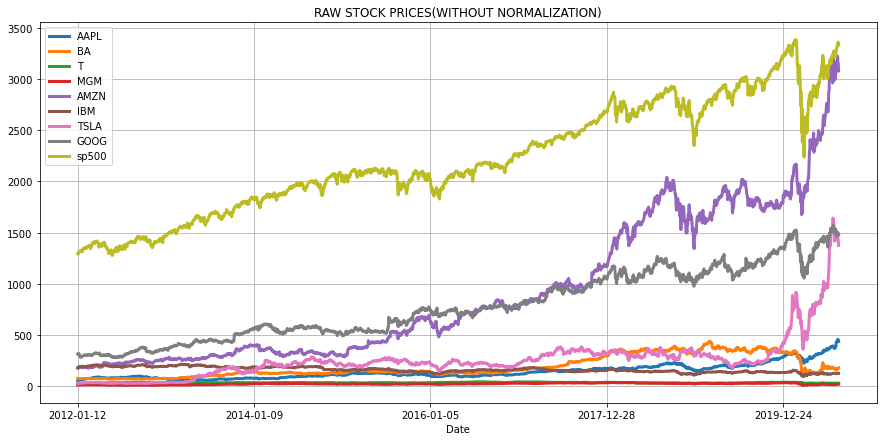

In [14]:
show_plot(stocks_df,"RAW STOCK PRICES(WITHOUT NORMALIZATION)")

In [17]:
def normalize(df):
    x=df.copy()
    for i in df.columns[1:]:
        x[i]=x[i]/x[i][0]
    return x

In [18]:
normalize(stocks_df)

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2012-01-13,0.996251,0.987949,0.998340,1.018137,1.014153,0.992301,0.806726,0.992615,0.995052
2,2012-01-17,1.007855,0.996424,1.004316,1.009893,1.032570,0.996954,0.941593,0.998317,0.998587
3,2012-01-18,1.018320,0.994040,1.006972,1.049464,1.076792,1.002880,0.949027,1.005193,1.009680
4,2012-01-19,1.015093,1.000662,1.009960,1.055235,1.105269,0.999834,0.947257,1.015771,1.014666
5,2012-01-20,0.997413,1.000132,1.012948,1.042045,1.085261,1.044143,0.941593,0.930675,1.015345
6,2012-01-23,1.014286,1.000000,1.009296,1.083265,1.057750,1.052229,0.947611,0.929928,1.015824
7,2012-01-24,0.997674,0.998013,0.999004,1.084913,1.062923,1.063030,0.970619,0.922638,1.014782
8,2012-01-25,1.059968,1.004105,1.002988,1.080791,1.067470,1.061922,0.990088,0.904469,1.023589
9,2012-01-26,1.055151,0.997351,0.977756,1.075845,1.098846,1.057768,1.024425,0.902262,1.017700


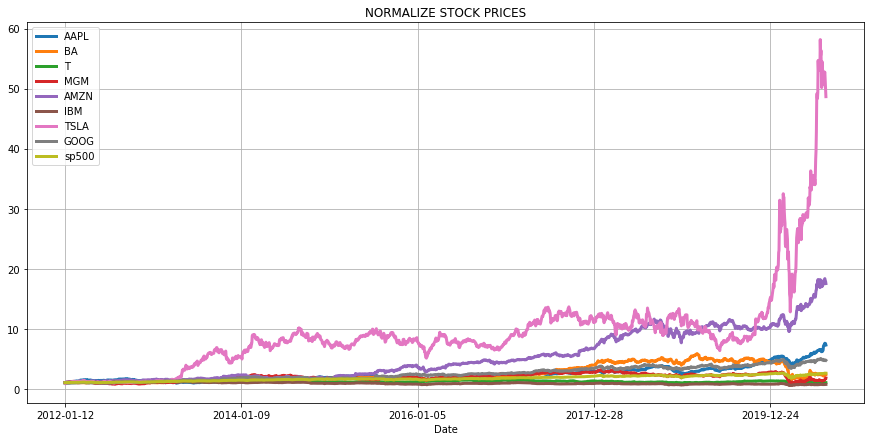

In [19]:
show_plot(normalize(stocks_df),"NORMALIZE STOCK PRICES")

In [23]:
def interactive_plot(df,title):
    fig=px.line(title=title)
    for i in df.columns[1:]:
        fig.add_scatter(x=df["Date"],y=df[i],name=i)
    fig.show()

In [24]:
interactive_plot(stocks_df,"PRICES")

In [25]:
interactive_plot(normalize(stocks_df),"NORMALIZE PRICES")

In [28]:
net_loss=3386.15-2237.4

In [29]:
net_loss

1148.75

In [30]:
df=stocks_df["sp500"]

In [31]:
df

0       1295.500000
1       1289.089966
2       1293.670044
3       1308.040039
4       1314.500000
5       1315.380005
6       1316.000000
7       1314.650024
8       1326.060059
9       1318.430054
10      1316.329956
11      1313.010010
12      1312.410034
13      1324.089966
14      1325.540039
15      1344.900024
16      1344.329956
17      1347.050049
18      1349.959961
19      1351.949951
20      1342.640015
21      1351.770020
22      1350.500000
23      1343.229980
24      1358.040039
25      1361.229980
26      1362.209961
27      1357.660034
28      1363.459961
29      1365.739990
30      1367.589966
31      1372.180054
32      1365.680054
33      1374.089966
34      1369.630005
35      1364.329956
36      1343.359985
37      1352.630005
38      1365.910034
39      1370.869995
40      1371.089966
41      1395.949951
42      1394.280029
43      1402.599976
44      1404.170044
45      1409.750000
46      1405.520020
47      1402.890015
48      1392.780029
49      1397.109985


In [32]:
daily_return_df=df.copy()

In [35]:
for j in range(1,len(df)):
    daily_return_df[j]=((df[j]-df[j-1])/df[j-1])*100
    daily_return_df[0]=0
daily_return_df

0        0.000000
1       -0.494792
2        0.355295
3        1.110793
4        0.493866
5        0.066946
6        0.047134
7       -0.102582
8        0.867914
9       -0.575389
10      -0.159288
11      -0.252212
12      -0.045695
13       0.889961
14       0.109515
15       1.460536
16      -0.042387
17       0.202338
18       0.216021
19       0.147411
20      -0.688630
21       0.680004
22      -0.093952
23      -0.538321
24       1.102571
25       0.234893
26       0.071992
27      -0.334011
28       0.427200
29       0.167224
30       0.135456
31       0.335633
32      -0.473699
33       0.615804
34      -0.324576
35      -0.386969
36      -1.537016
37       0.690062
38       0.981793
39       0.363125
40       0.016046
41       1.813155
42      -0.119626
43       0.596720
44       0.111940
45       0.397385
46      -0.300052
47      -0.187120
48      -0.720654
49       0.310886
50       1.388583
51      -0.281678
52      -0.494151
53      -0.160793
54       0.369844
55       0

In [36]:
df=stocks_df["AMZN"]
df

0        175.929993
1        178.419998
2        181.660004
3        189.440002
4        194.449997
5        190.929993
6        186.089996
7        187.000000
8        187.800003
9        193.320007
10       195.369995
11       192.149994
12       194.440002
13       179.460007
14       181.720001
15       187.679993
16       183.139999
17       184.190002
18       185.479996
19       184.979996
20       185.539993
21       191.589996
22       191.300003
23       184.470001
24       179.929993
25       182.500000
26       182.259995
27       180.580002
28       178.889999
29       179.130005
30       178.529999
31       183.800003
32       179.690002
33       180.039993
34       179.300003
35       180.259995
36       181.089996
37       183.770004
38       187.639999
39       184.320007
40       183.389999
41       184.589996
42       182.259995
43       184.429993
44       185.050003
45       185.520004
46       192.330002
47       191.729996
48       192.399994
49       195.039993


In [38]:
daily_return_df=df.copy()

for j in range(1,len(df)):
    daily_return_df[j]=((df[j]-df[j-1])/df[j-1])*100
    daily_return_df[0]=0
daily_return_df

0        0.000000
1        1.415339
2        1.815943
3        4.282725
4        2.644634
5       -1.810236
6       -2.534959
7        0.489013
8        0.427809
9        2.939299
10       1.060412
11      -1.648155
12       1.191781
13      -7.704173
14       1.259330
15       3.279767
16      -2.419008
17       0.573334
18       0.700360
19      -0.269571
20       0.302734
21       3.260754
22      -0.151361
23      -3.570309
24      -2.461109
25       1.428337
26      -0.131510
27      -0.921756
28      -0.935875
29       0.134164
30      -0.334956
31       2.951887
32      -2.236127
33       0.194775
34      -0.411014
35       0.535411
36       0.460447
37       1.479932
38       2.105890
39      -1.769341
40      -0.504562
41       0.654342
42      -1.262257
43       1.190606
44       0.336176
45       0.253986
46       3.670762
47      -0.311967
48       0.349449
49       1.372141
50       4.014562
51       1.266825
52      -2.083332
53       1.715051
54      -1.026346
55      -2

In [39]:
def daily_return(df):
    daily_return_df=df.copy()

In [52]:
   def daily_return(df):
    daily_return_df=df.copy()
    
    for i in df.columns[1:]:
    
      for j in range(1,len(df)):
            daily_return_df[i][j]=((df[i][j]-df[i][j-1])/df[i][j-1])*100
            daily_return_df[i][0]=0
    return daily_return_df

In [53]:
stocks_daily_return=daily_return(stocks_df)

In [54]:
stocks_daily_return

,Date,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
0,2012-01-12,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2012-01-13,-0.374946,-1.205144,-0.166006,1.813685,1.415339,-0.769869,-19.327430,-0.738516,-0.494792
2,2012-01-17,1.164812,0.857909,0.598603,-0.809717,1.815943,0.468852,16.717854,0.574410,0.355295
3,2012-01-18,1.038382,-0.239234,0.264463,3.918367,4.282725,0.594448,0.789470,0.688856,1.110793
4,2012-01-19,-0.316937,0.666134,0.296736,0.549882,2.644634,-0.303752,-0.186494,1.052283,0.493866
5,2012-01-20,-1.741670,-0.052939,0.295858,-1.250000,-1.810236,4.431642,-0.597907,-8.377507,0.066946
6,2012-01-23,1.691647,-0.013235,-0.360538,3.955696,-2.534959,0.774449,0.639098,-0.080209,0.047134
7,2012-01-24,-1.637772,-0.198651,-1.019737,0.152207,0.489013,1.026422,2.428091,-0.783911,-0.102582
8,2012-01-25,6.243905,0.610402,0.398800,-0.379939,0.427809,-0.104203,2.005832,-1.969256,0.867914
9,2012-01-26,-0.454486,-0.672648,-2.515717,-0.457666,2.939299,-0.391175,3.468009,-0.244081,-0.575389


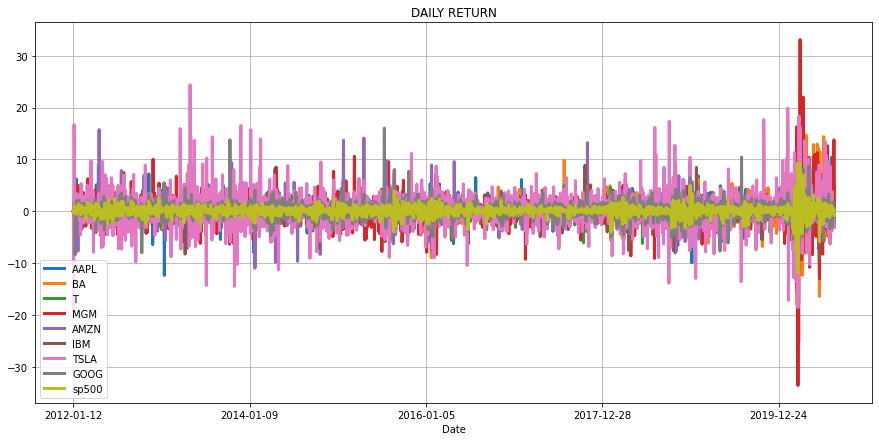

In [57]:
show_plot(stocks_daily_return,"DAILY RETURN")

In [59]:
interactive_plot(stocks_daily_return,"STOCKS DAILY RETURNS")

In [60]:
cm=stocks_daily_return.drop(columns="Date").corr()

In [61]:
cm

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
AAPL,1.000000,0.385250,0.341373,0.384089,0.410234,0.434534,0.288535,0.509125,0.657321
BA,0.385250,1.000000,0.401602,0.554229,0.267466,0.479264,0.250946,0.388048,0.641826
T,0.341373,0.401602,1.000000,0.340166,0.233145,0.484219,0.152515,0.353695,0.617463
MGM,0.384089,0.554229,0.340166,1.000000,0.309016,0.441631,0.311879,0.439142,0.631449
AMZN,0.410234,0.267466,0.233145,0.309016,1.000000,0.339589,0.310084,0.575284,0.539560
IBM,0.434534,0.479264,0.484219,0.441631,0.339589,1.000000,0.245609,0.458816,0.703935
TSLA,0.288535,0.250946,0.152515,0.311879,0.310084,0.245609,1.000000,0.322805,0.387921
GOOG,0.509125,0.388048,0.353695,0.439142,0.575284,0.458816,0.322805,1.000000,0.684572
sp500,0.657321,0.641826,0.617463,0.631449,0.539560,0.703935,0.387921,0.684572,1.000000


<AxesSubplot:>

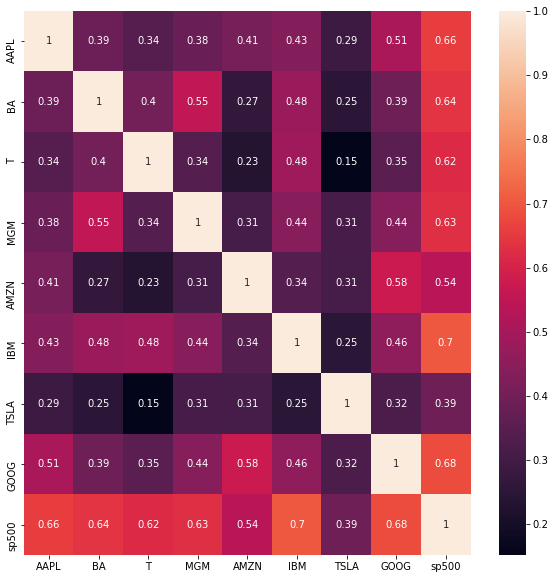

In [64]:
plt.figure(figsize=(10,10))
sns.heatmap(cm,annot=True)

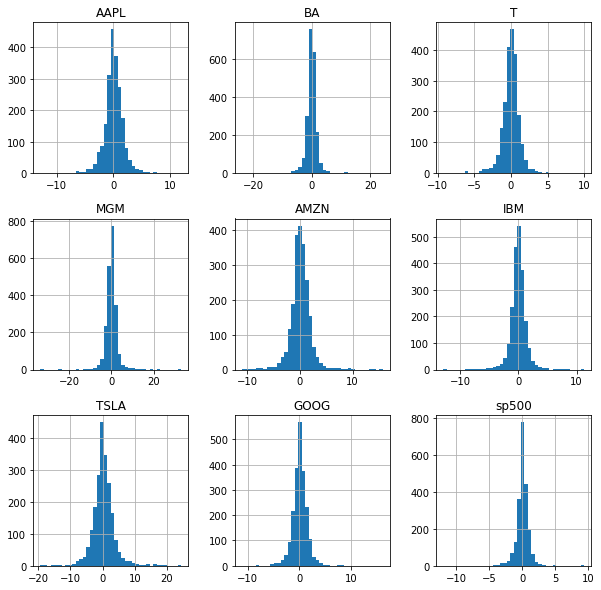

In [66]:
stocks_daily_return.hist(figsize=(10,10),bins=40);

In [67]:
df_hist=stocks_daily_return.copy()
df_hist=df_hist.drop(columns=["Date"])

In [71]:
data=[]
for i in df_hist.columns:
    data.append(stocks_daily_return[i].values)

In [73]:
data

[array([ 0.        , -0.37494578,  1.16481192, ..., -2.44945751,
         1.45347999, -2.9739868 ]),
 array([ 0.        , -1.20514366,  0.85790887, ..., -1.26596576,
         5.52287953,  0.40131597]),
 array([ 0.        , -0.16600597,  0.59860326, ...,  0.60321716,
         0.5996036 ,  0.        ]),
 array([ 0.        ,  1.81368508, -0.8097166 , ...,  3.08776831,
        13.76772918, -0.69284065]),
 array([ 0.        ,  1.41533854,  1.8159433 , ..., -1.78418726,
        -0.60932259, -2.14379167]),
 array([ 0.        , -0.76986928,  0.46885241, ..., -0.91976211,
         1.72055219, -0.28322004]),
 array([  0.        , -19.32743009,  16.71785359, ...,  -2.47519409,
         -2.35009162,  -3.1143992 ]),
 array([ 0.        , -0.73851634,  0.57441015, ..., -0.37397414,
         0.10772812, -1.05474435]),
 array([ 0.        , -0.49479228,  0.35529545, ...,  0.06330295,
         0.27422185, -0.79691324])]

In [74]:
fig=ff.create_distplot(data,df_hist.columns)
fig.show()

In [75]:
df_hist=stocks_daily_return.copy()
df_hist=df_hist.drop(columns=["Date"])

In [77]:
data=[]

In [78]:
for i in df_hist.columns:
    data.append(stocks_daily_return[i].values)

In [79]:
data

[array([ 0.        , -0.37494578,  1.16481192, ..., -2.44945751,
         1.45347999, -2.9739868 ]),
 array([ 0.        , -1.20514366,  0.85790887, ..., -1.26596576,
         5.52287953,  0.40131597]),
 array([ 0.        , -0.16600597,  0.59860326, ...,  0.60321716,
         0.5996036 ,  0.        ]),
 array([ 0.        ,  1.81368508, -0.8097166 , ...,  3.08776831,
        13.76772918, -0.69284065]),
 array([ 0.        ,  1.41533854,  1.8159433 , ..., -1.78418726,
        -0.60932259, -2.14379167]),
 array([ 0.        , -0.76986928,  0.46885241, ..., -0.91976211,
         1.72055219, -0.28322004]),
 array([  0.        , -19.32743009,  16.71785359, ...,  -2.47519409,
         -2.35009162,  -3.1143992 ]),
 array([ 0.        , -0.73851634,  0.57441015, ..., -0.37397414,
         0.10772812, -1.05474435]),
 array([ 0.        , -0.49479228,  0.35529545, ...,  0.06330295,
         0.27422185, -0.79691324])]

In [80]:
fig=ff.create_distplot(data,df_hist.columns)

In [81]:
fig.show()